In [1]:
# reload packages
%load_ext autoreload
%autoreload 2

### Choose GPU (this may not be needed on your computer)

import socket
import GPUtil
import os

# check for GPU availability
if socket.gethostname() in ["txori", "pakhi"]:
    deviceIDs = GPUtil.getAvailable()
    if len(deviceIDs) < 1:
        GPUtil.showUtilization()
        print("No GPUs available")
        deviceID = ''
    else:
        deviceID = deviceIDs[0]
        print("Using GPU: {}".format(deviceID))
    # set device ID
    os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
    os.environ["CUDA_VISIBLE_DEVICES"] = str(deviceID)

Using GPU: 0


### Self contained tensorflow 2.0 notebook for feature / class visualization in convnets
- This is a self contained notebook capturing some core ideas from feature and class visualization in neural networks, and applying some ideas of my own. 

In [2]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tqdm.autonotebook import tqdm

/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/autonotebook/__init__.py:14: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  " (e.g. in jupyter console)", TqdmExperimentalWarning)


In [3]:
import warnings
warnings.filterwarnings('ignore')
tf.autograph.set_verbosity(0)

In [4]:
# Create a connection between the input and the target layer
model = tf.keras.applications.vgg16.VGG16(weights='imagenet', include_top=True, classes=1000)

In [5]:
# look at the layers of the model
model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

### get model classes

In [6]:
from tensorflow.keras.applications.vgg16 import decode_predictions
import pandas as pd

In [7]:
classes = pd.DataFrame(
    [
        list([j[0] for j in i])
        for i in np.array(
            decode_predictions(np.expand_dims(np.arange(1000), 0), top=1000)
        ).T
    ]
).T
classes.columns = ["", "label_", "index_"]
classes['index_'] = np.int32(classes['index_'].values)
classes = classes.sort_values(by="index_")
class_list = classes.label_.values
classes[:3]

,,label_,index_
999,n01440764,tench,0
998,n01443537,goldfish,1
997,n01484850,great_white_shark,2


In [16]:
class_list#[:10]

array(['tench', 'goldfish', 'great_white_shark', 'tiger_shark',
       'hammerhead', 'electric_ray', 'stingray', 'cock', 'hen', 'ostrich',
       'brambling', 'goldfinch', 'house_finch', 'junco', 'indigo_bunting',
       'robin', 'bulbul', 'jay', 'magpie', 'chickadee', 'water_ouzel',
       'kite', 'bald_eagle', 'vulture', 'great_grey_owl',
       'European_fire_salamander', 'common_newt', 'eft',
       'spotted_salamander', 'axolotl', 'bullfrog', 'tree_frog',
       'tailed_frog', 'loggerhead', 'leatherback_turtle', 'mud_turtle',
       'terrapin', 'box_turtle', 'banded_gecko', 'common_iguana',
       'American_chameleon', 'whiptail', 'agama', 'frilled_lizard',
       'alligator_lizard', 'Gila_monster', 'green_lizard',
       'African_chameleon', 'Komodo_dragon', 'African_crocodile',
       'American_alligator', 'triceratops', 'thunder_snake',
       'ringneck_snake', 'hognose_snake', 'green_snake', 'king_snake',
       'garter_snake', 'water_snake', 'vine_snake', 'night_snake',
     

#### normalization functions

In [9]:
def zero_one_norm(x):
    return (x - tf.reduce_min(x)) / (tf.reduce_max(x) - tf.reduce_min(x))
def z_score(x, scale = 1.0):
    return (x - tf.reduce_mean(x)) / (tf.math.reduce_std(x)/scale)
def norm(x):
    return zero_one_norm(z_score(x))
def soft_norm(x, n_std = 15):
    """ zscore and set n_std range of 0-1, then clip
    """
    x = z_score(x) / (n_std*2)
    return tf.clip_by_value(x + 0.5, 0, 1)

In [10]:
def adjust_hsv(imgs, sat_exp = 2.0, val_exp = 0.5):
    """ normalize color for less emphasis on lower saturation
    """
    # convert to hsv
    
    hsv = tf.image.rgb_to_hsv(imgs)
    hue, sat, val = tf.split(hsv, 3, axis=2)
    
    # manipulate saturation and value
    sat = tf.math.pow(sat,sat_exp)
    val = tf.math.pow(val,val_exp)
    # rejoin hsv
    hsv_new = tf.squeeze(tf.stack([hue, sat, val], axis=2), axis = 3)
    
    # convert to rgb
    rgb = tf.image.hsv_to_rgb(hsv_new)
    return rgb

#### functions for initializing noise

In [11]:
def gen_noise(dim=244, nex = 1):
    """ Generate some noise to initialize
    """
    input_img_data = tf.random.uniform((nex, dim, dim, 3))
    return tf.Variable(tf.cast(input_img_data, tf.float32))

## Reconstruct image from latent representations

In [171]:
def update_image_step(input_data, correct_output, submodel, optimizer):
    """ gradient descent to reconstruct image
    """
    with tf.GradientTape() as tape:
        tape.watch(input_data)
        # get output from model
        outputs = submodel(input_data)
        # get loss
        #loss_value = bce(correct_output, outputs)
        loss_value = tf.reduce_mean(tf.math.square(correct_output - outputs))
        # compute gradients
        grads = tape.gradient(loss_value, input_data)
        # optimize
        optimizer.apply_gradients(zip([grads], [input_data]))
        # clip data
        input_data.assign(tf.clip_by_value(input_data, 0, 1))

    return input_data, loss_value


def synthesize_image(img, submodel, steps=1000, lr=1e-2):
    """
    """
    # initialize optimizer
    optimizer = tf.keras.optimizers.Adam(lr)
    # error is binary cross entropy between layer activation for synthesized image vs real image
    bce = tf.keras.losses.BinaryCrossentropy()
    # generate noise for recosruction
    input_data = gen_noise()

    # get correct, output for filter
    correct_output = submodel(img)

    loss_values = []
    # loop through gradient descent steps
    for n in tqdm(np.arange(steps), leave=False):
        input_data, loss_value = update_image_step(
            input_data, correct_output, submodel, optimizer
        )
        loss_values.append(loss_value.numpy())
    return np.squeeze(input_data.numpy()), loss_values

In [172]:
layers = [
    "block1_conv1",
    "block1_conv2",
    "block2_conv1",
    "block2_conv2",
    "block3_conv1",
    "block3_conv2",
    "block3_conv3",
    "block4_conv1",
    "block4_conv2",
    "block4_conv3",
    "block5_conv1",
    "block5_conv2",
    "block5_conv3",
    "fc1",
    "fc2",
    "predictions"
]

In [173]:
# load image
img = data.astronaut()
img = resize(img, (244, 244, 3))

W0520 00:20:34.334788 140250006357824 network.py:847] Model was constructed with shape Tensor("input_1:0", shape=(None, 224, 224, 3), dtype=float32) for input (None, 224, 224, 3), but it was re-called on a Tensor with incompatible shape (1, 244, 244, 3).


block1_conv1


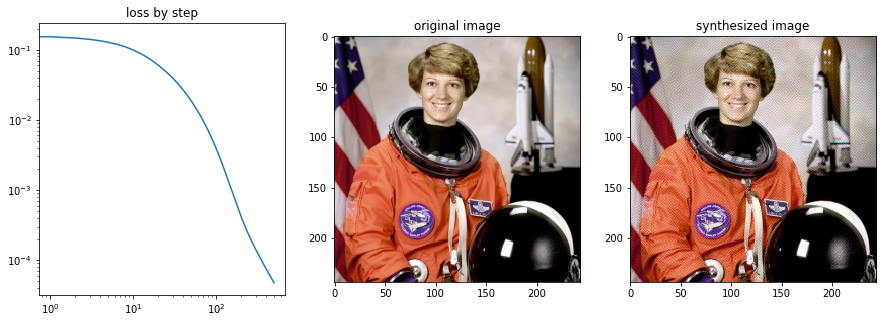

W0520 00:20:36.511548 140250006357824 network.py:847] Model was constructed with shape Tensor("input_1:0", shape=(None, 224, 224, 3), dtype=float32) for input (None, 224, 224, 3), but it was re-called on a Tensor with incompatible shape (1, 244, 244, 3).


block1_conv2


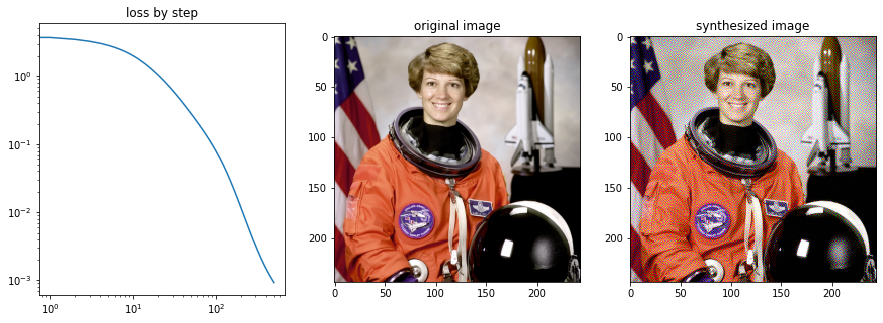

W0520 00:20:39.780395 140250006357824 network.py:847] Model was constructed with shape Tensor("input_1:0", shape=(None, 224, 224, 3), dtype=float32) for input (None, 224, 224, 3), but it was re-called on a Tensor with incompatible shape (1, 244, 244, 3).


block2_conv1


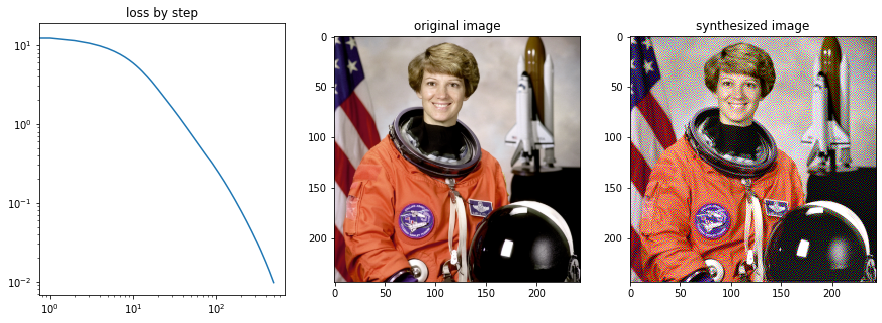

W0520 00:20:43.934860 140250006357824 network.py:847] Model was constructed with shape Tensor("input_1:0", shape=(None, 224, 224, 3), dtype=float32) for input (None, 224, 224, 3), but it was re-called on a Tensor with incompatible shape (1, 244, 244, 3).


block2_conv2


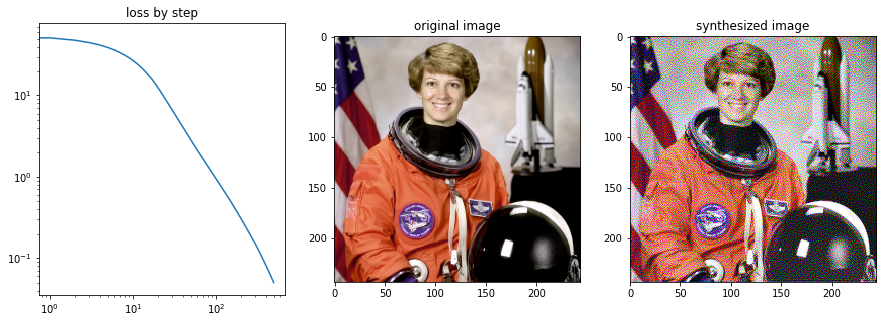

W0520 00:20:48.700558 140250006357824 network.py:847] Model was constructed with shape Tensor("input_1:0", shape=(None, 224, 224, 3), dtype=float32) for input (None, 224, 224, 3), but it was re-called on a Tensor with incompatible shape (1, 244, 244, 3).


block3_conv1


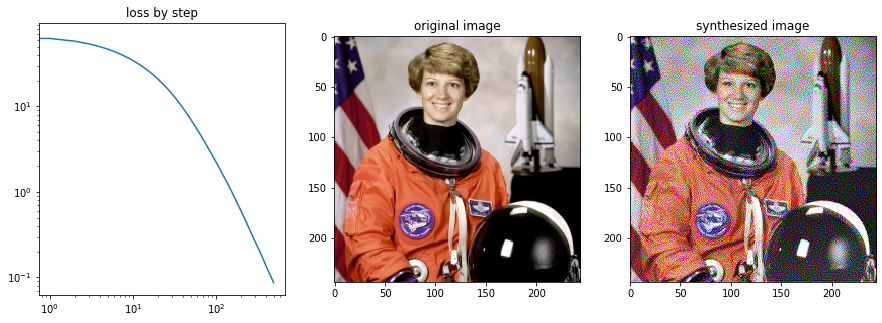

W0520 00:20:54.166189 140250006357824 network.py:847] Model was constructed with shape Tensor("input_1:0", shape=(None, 224, 224, 3), dtype=float32) for input (None, 224, 224, 3), but it was re-called on a Tensor with incompatible shape (1, 244, 244, 3).


block3_conv2


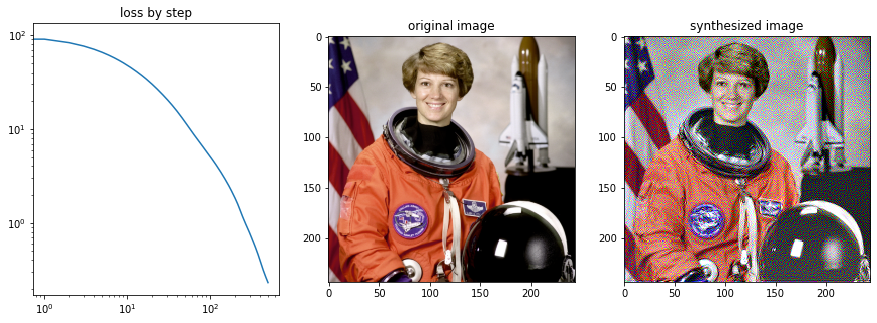

W0520 00:21:00.511632 140250006357824 network.py:847] Model was constructed with shape Tensor("input_1:0", shape=(None, 224, 224, 3), dtype=float32) for input (None, 224, 224, 3), but it was re-called on a Tensor with incompatible shape (1, 244, 244, 3).


block3_conv3


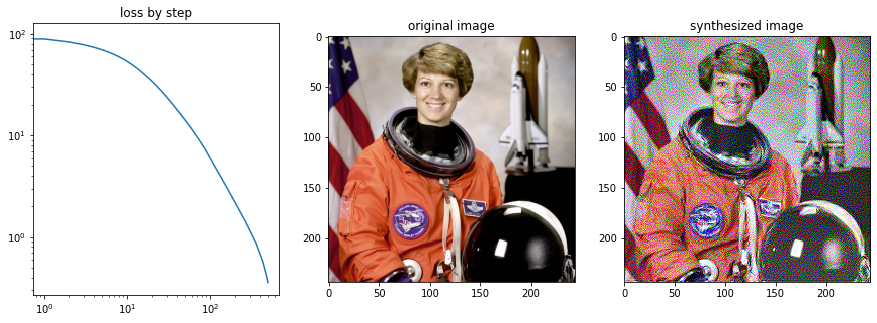

W0520 00:21:07.319307 140250006357824 network.py:847] Model was constructed with shape Tensor("input_1:0", shape=(None, 224, 224, 3), dtype=float32) for input (None, 224, 224, 3), but it was re-called on a Tensor with incompatible shape (1, 244, 244, 3).


block4_conv1


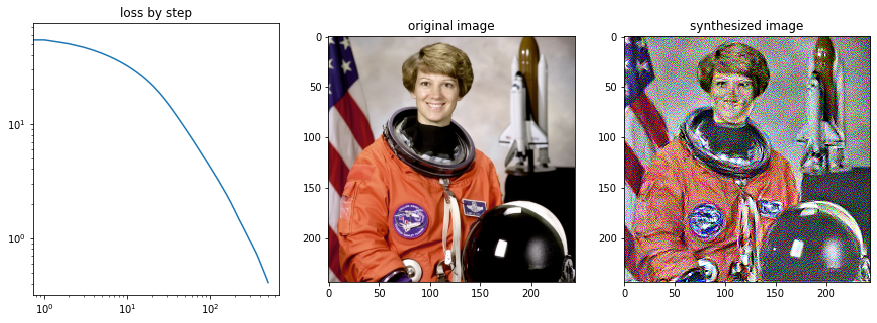

W0520 00:21:15.037877 140250006357824 network.py:847] Model was constructed with shape Tensor("input_1:0", shape=(None, 224, 224, 3), dtype=float32) for input (None, 224, 224, 3), but it was re-called on a Tensor with incompatible shape (1, 244, 244, 3).


block4_conv2


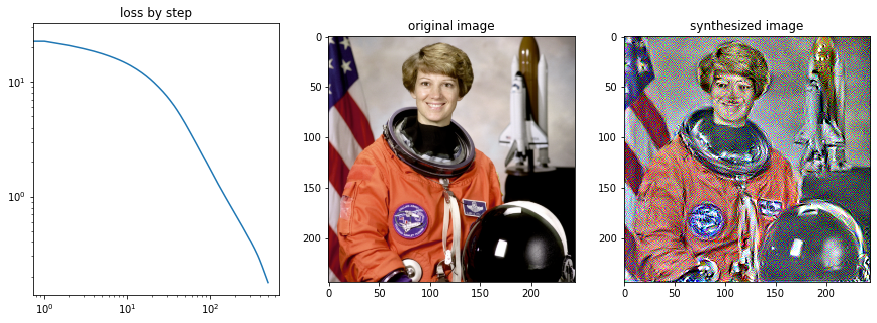

W0520 00:21:23.267498 140250006357824 network.py:847] Model was constructed with shape Tensor("input_1:0", shape=(None, 224, 224, 3), dtype=float32) for input (None, 224, 224, 3), but it was re-called on a Tensor with incompatible shape (1, 244, 244, 3).


block4_conv3


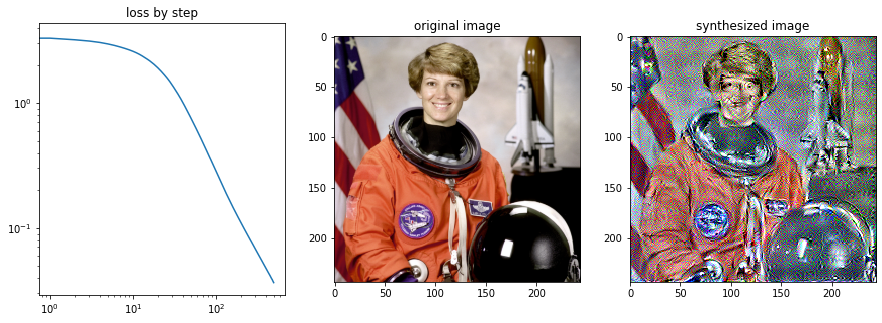

W0520 00:21:32.746465 140250006357824 network.py:847] Model was constructed with shape Tensor("input_1:0", shape=(None, 224, 224, 3), dtype=float32) for input (None, 224, 224, 3), but it was re-called on a Tensor with incompatible shape (1, 244, 244, 3).


block5_conv1


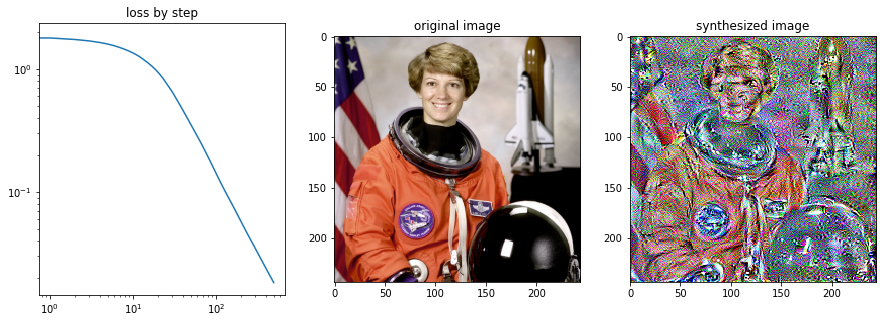

W0520 00:21:42.975715 140250006357824 network.py:847] Model was constructed with shape Tensor("input_1:0", shape=(None, 224, 224, 3), dtype=float32) for input (None, 224, 224, 3), but it was re-called on a Tensor with incompatible shape (1, 244, 244, 3).


block5_conv2


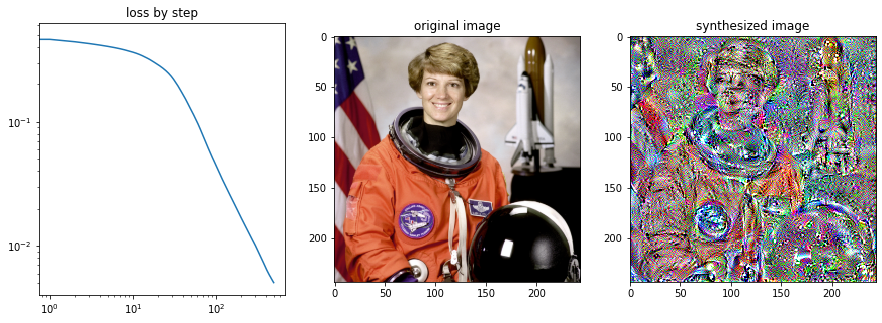

W0520 00:21:53.941107 140250006357824 network.py:847] Model was constructed with shape Tensor("input_1:0", shape=(None, 224, 224, 3), dtype=float32) for input (None, 224, 224, 3), but it was re-called on a Tensor with incompatible shape (1, 244, 244, 3).


block5_conv3


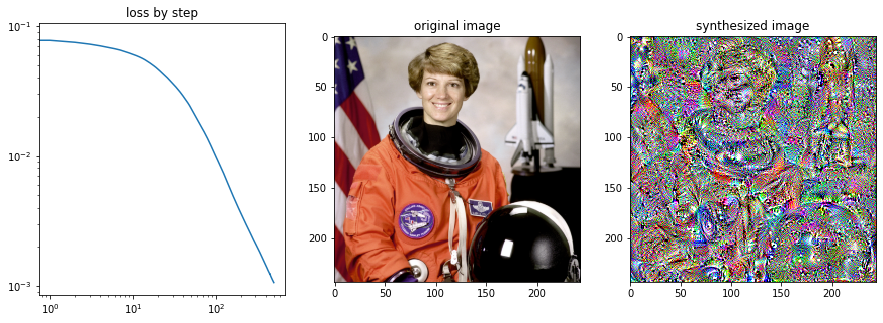

W0520 00:22:05.461558 140250006357824 network.py:847] Model was constructed with shape Tensor("input_1:0", shape=(None, 224, 224, 3), dtype=float32) for input (None, 224, 224, 3), but it was re-called on a Tensor with incompatible shape (1, 244, 244, 3).


fc1


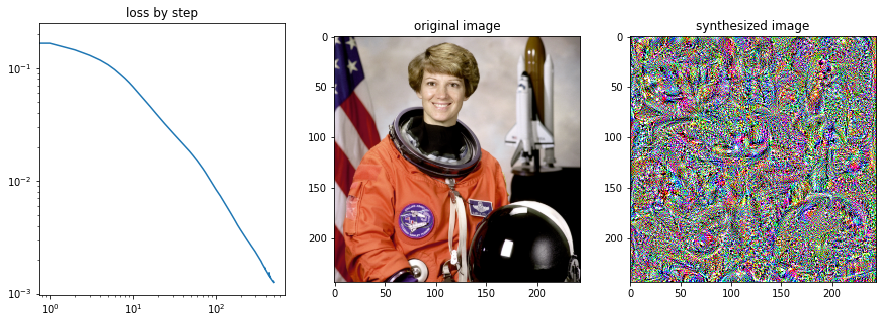

W0520 00:22:18.369088 140250006357824 network.py:847] Model was constructed with shape Tensor("input_1:0", shape=(None, 224, 224, 3), dtype=float32) for input (None, 224, 224, 3), but it was re-called on a Tensor with incompatible shape (1, 244, 244, 3).


fc2


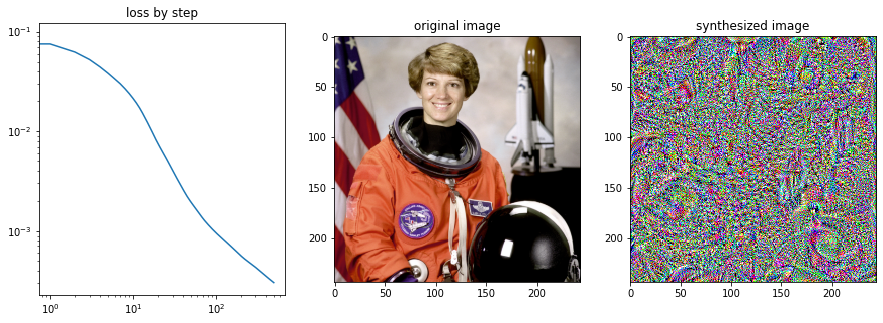

W0520 00:22:31.411251 140250006357824 network.py:847] Model was constructed with shape Tensor("input_1:0", shape=(None, 224, 224, 3), dtype=float32) for input (None, 224, 224, 3), but it was re-called on a Tensor with incompatible shape (1, 244, 244, 3).


predictions


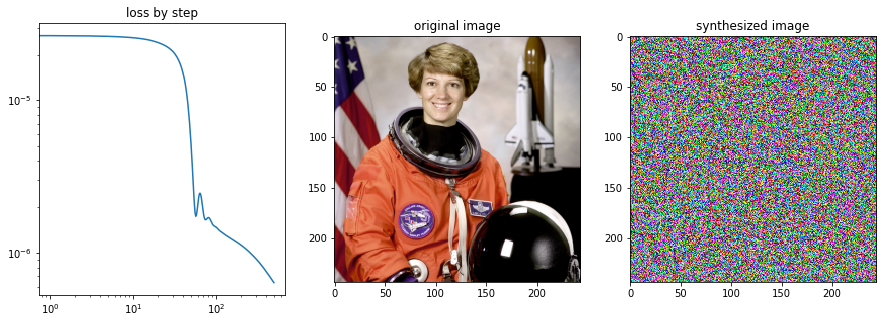

In [175]:
layer_imgs = []
losses_list = []
for layer_name in tqdm(layers):
    print(layer_name)
    submodel = tf.keras.models.Model(
        [model.inputs[0]], [model.get_layer(layer_name).output]
    )
    # reconstruct image
    synthesized_img, losses = synthesize_image(tf.expand_dims(img[:,:,::-1],0), submodel, steps=500, lr=1e-2)
    losses_list.append(losses)
    layer_imgs.append((layer_name, np.squeeze(synthesized_img)[:, :, ::-1]))
    
    # plot image
    fig, axs = plt.subplots(ncols=3, figsize=(15,5))
    axs[0].loglog(losses)
    axs[0].set_title("loss by step")
    axs[1].imshow(np.squeeze(img))
    axs[1].set_title("original image")
    axs[2].imshow(np.squeeze(synthesized_img)[:, :, ::-1])
    axs[2].set_title("synthesized image")
    plt.show()

In [176]:
len(layer_imgs)

16

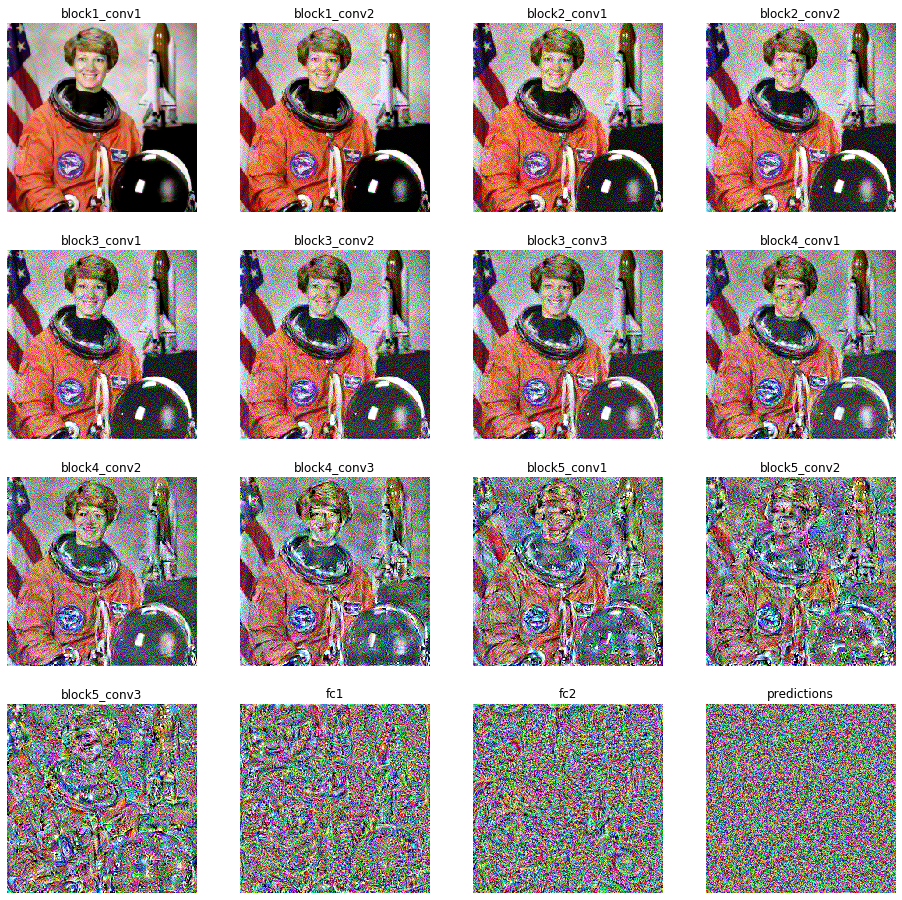

In [177]:
ncols = 4
nrows = int(len(layer_imgs) / ncols)
fig, axs = plt.subplots(ncols=ncols, nrows=nrows, figsize=(ncols*4, nrows*4))
for lii, (ln, li) in enumerate(layer_imgs):
    ax = axs.flatten()[lii]
    ax.set_title(ln)
    ax.imshow(li)
    ax.axis('off')

### Visualize higher-level features
- for the fully connected layers, most of the structure in the data was lost. If we use some of the optimization techniques used in the class visualization section, maybe we can get them back.

In [178]:
def get_opt_function_reconstruction():
    """ This function returns the optimizer function. This is just necessary because of tensorflow weirdness. 
    See: https://github.com/tensorflow/tensorflow/issues/27120#issuecomment-540071844
    """
    @tf.function
    def get_opt_function_reconstruction(
        correct_output,
        submodel,
        input_data,
        optimizer,
        steps=100,
        lr=0.01,
        layer_dims=2,
        soft_norm_std=15,
        norm_f = "soft_norm"
    ):
        """ This function runs a single optimization over the list of images
        """
        # optimization
        for n in tf.range(steps):
            with tf.GradientTape() as tape:
                tape.watch(input_data)
                
                if norm_f == "sigmoid":
                    outputs = submodel(tf.nn.sigmoid(input_data))
                else:
                    outputs = submodel(input_data)
                
                loss_value = tf.reduce_mean(tf.math.square(correct_output - outputs))
                
                grads = tape.gradient(loss_value, input_data)
                
                norm_divisor = tf.expand_dims(
                    tf.expand_dims(
                        tf.expand_dims(tf.math.reduce_std(grads, axis=[1, 2, 3]), 1), 1
                    ),
                    1,
                )
                
                normalized_grads = grads / norm_divisor
                optimizer.apply_gradients(zip([normalized_grads], [input_data]))

                if norm_f == "clip":
                    input_data.assign(tf.clip_by_value(input_data, 0, 1))
                elif norm_f == "soft_norm":
                    input_data.assign(soft_norm(input_data, n_std=soft_norm_std))
                elif norm_f == "sigmoid":
                    input_data.assign(tf.clip_by_value(input_data, -50, 50))
                    # normalizes color channels to sit scale roughly uniform
                    input_data.assign(z_score(input_data, scale=1.5))
                    
                    
        return input_data, 0
        
    return get_opt_function_reconstruction

def optimize_filter_for_image(
    img,
    submodel,
    layer_name,
    steps=20,
    lr=0.01,
    layer_dims=2,
    n_upsample=1,
    sigma=0,
    upscaling_factor=1.1,
    soft_norm_std=15,
    single_receptive_field=True,
    norm_f = "soft_norm"
):
    """ This pulls together the steps for optimizing the image, and upsampling
    """

    opt_reconstruction = get_opt_function_reconstruction()
    optimizer = tf.keras.optimizers.Adam(lr)
    
    # get correct, output for filter
    correct_output = submodel(img)
        
    loss_list = []
    # list of outputs during optimization
    output_images = []
    # generate initial noise
    img_data = gen_noise(nex=1)
    output_images.append(img_data.numpy())
    
    # apply optimization
    for i in tqdm(range(n_upsample), leave=False):
        
        # optimize
        img_data, loss = opt_reconstruction(
            correct_output,
            submodel,
            img_data,
            optimizer=optimizer,
            steps=steps,
            lr=lr,
            layer_dims=layer_dims,
            soft_norm_std=soft_norm_std,
            norm_f = norm_f
        )        
        
        loss_list.append(0)
        output_images.append(img_data.numpy())
        
        # upsample
        if i < (n_upsample - 1):
            img_data = upscale_image(
                img_data.numpy(), upscaling_factor=upscaling_factor, sigma=sigma,
            )
    
    # brg to rgb color channel conversion
    if norm_f == "sigmoid":
        output_images = [tf.nn.sigmoid(i).numpy()[:,:,:,::-1] for i in output_images]
    else:
        output_images = [i[:,:,:,::-1] for i in output_images]

    return output_images, loss_list

W0520 00:23:16.885969 140250006357824 network.py:847] Model was constructed with shape Tensor("input_1:0", shape=(None, 224, 224, 3), dtype=float32) for input (None, 224, 224, 3), but it was re-called on a Tensor with incompatible shape (1, 244, 244, 3).


block4_conv1


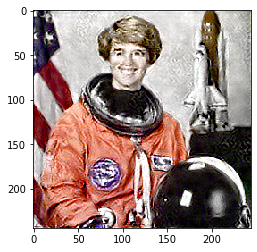

W0520 00:23:27.301285 140250006357824 network.py:847] Model was constructed with shape Tensor("input_1:0", shape=(None, 224, 224, 3), dtype=float32) for input (None, 224, 224, 3), but it was re-called on a Tensor with incompatible shape (1, 244, 244, 3).


fc1


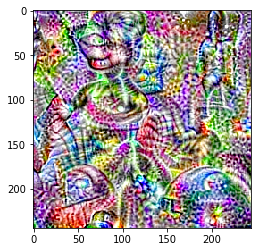

W0520 00:23:45.366699 140250006357824 network.py:847] Model was constructed with shape Tensor("input_1:0", shape=(None, 224, 224, 3), dtype=float32) for input (None, 224, 224, 3), but it was re-called on a Tensor with incompatible shape (1, 244, 244, 3).


fc2


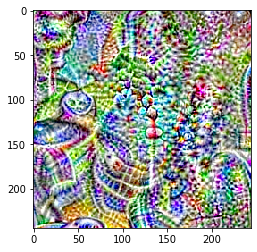

W0520 00:24:04.016502 140250006357824 network.py:847] Model was constructed with shape Tensor("input_1:0", shape=(None, 224, 224, 3), dtype=float32) for input (None, 224, 224, 3), but it was re-called on a Tensor with incompatible shape (1, 244, 244, 3).


predictions


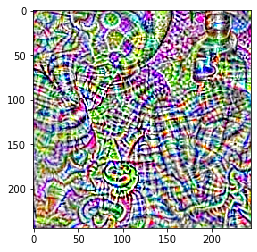

In [179]:
for layer_name in tqdm(['block4_conv1', 'fc1', 'fc2', 'predictions']):
    print(layer_name)
    submodel = tf.keras.models.Model(
        [model.inputs[0]], [model.get_layer(layer_name).output]
    )
    output_images, loss_list = optimize_filter_for_image(
        tf.expand_dims(img[:,:,::-1],0),
        submodel,
        layer_name,
        steps = 20, # how many training steps to perform
        lr=0.1, # gradient step size 
        layer_dims=len(submodel.outputs[0].shape), # how many dimensions the output layer is (2 for fully connected, 4 for convolutional)
        n_upsample=100, # how many steps to upsample
        sigma=1.0, # the amount of blurring to perform when upsampling
        upscaling_factor=1.01, # how much to upsample by
        single_receptive_field=False, # whether to optimize a single neuron, or optimize over the layer
        norm_f = "clip", # how to normalize/color channels between 0 and 1 (clip, sigmoid, )
        soft_norm_std = 3, # the number of standard deviations to clip if norm_f is soft_norm (lower = more saturated)

    )
    rgb = adjust_hsv(np.squeeze(output_images[-1]), sat_exp = 2.0, val_exp = 1.0)
    plt.imshow(rgb)
    plt.show()
    #break

W0520 00:25:22.151279 140250006357824 network.py:847] Model was constructed with shape Tensor("input_1:0", shape=(None, 224, 224, 3), dtype=float32) for input (None, 224, 224, 3), but it was re-called on a Tensor with incompatible shape (1, 244, 244, 3).


block1_conv1


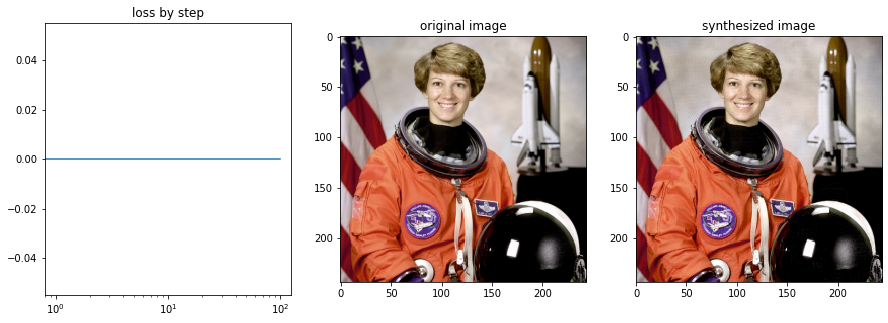

W0520 00:25:25.605201 140250006357824 network.py:847] Model was constructed with shape Tensor("input_1:0", shape=(None, 224, 224, 3), dtype=float32) for input (None, 224, 224, 3), but it was re-called on a Tensor with incompatible shape (1, 244, 244, 3).


block1_conv2


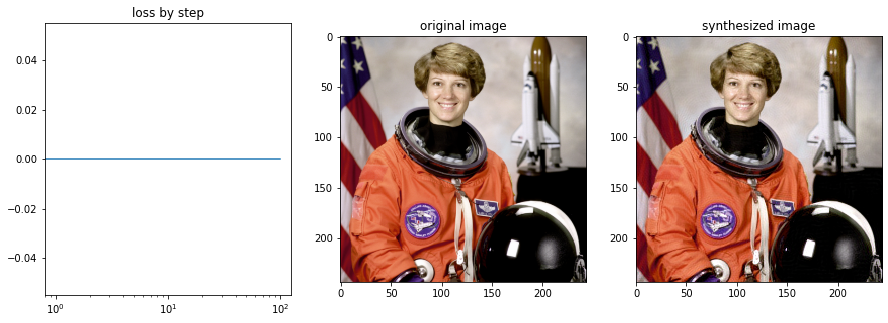

W0520 00:25:30.444241 140250006357824 network.py:847] Model was constructed with shape Tensor("input_1:0", shape=(None, 224, 224, 3), dtype=float32) for input (None, 224, 224, 3), but it was re-called on a Tensor with incompatible shape (1, 244, 244, 3).


block2_conv1


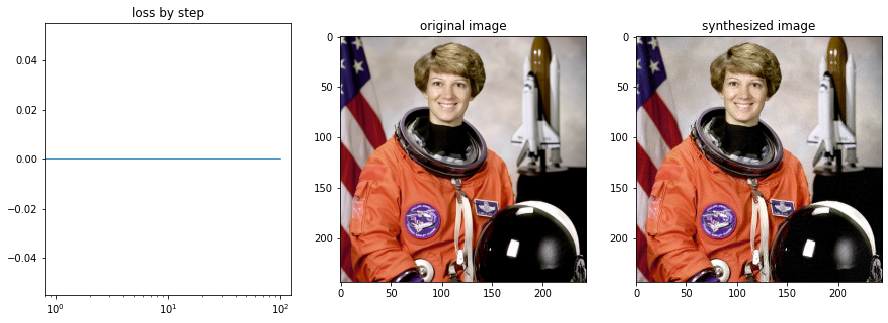

W0520 00:25:35.747811 140250006357824 network.py:847] Model was constructed with shape Tensor("input_1:0", shape=(None, 224, 224, 3), dtype=float32) for input (None, 224, 224, 3), but it was re-called on a Tensor with incompatible shape (1, 244, 244, 3).


block2_conv2


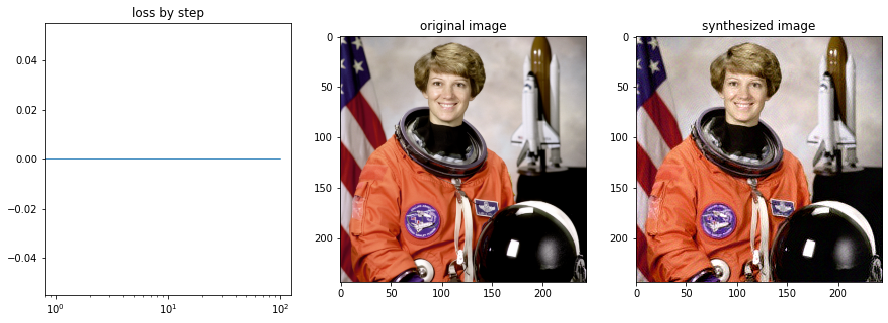

W0520 00:25:42.540529 140250006357824 network.py:847] Model was constructed with shape Tensor("input_1:0", shape=(None, 224, 224, 3), dtype=float32) for input (None, 224, 224, 3), but it was re-called on a Tensor with incompatible shape (1, 244, 244, 3).


block3_conv1


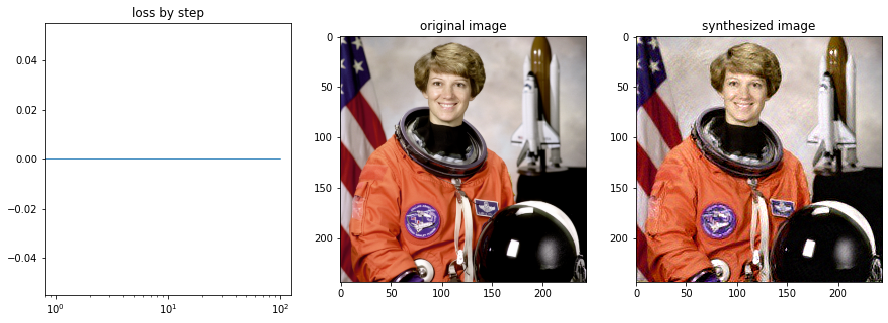

W0520 00:25:49.711664 140250006357824 network.py:847] Model was constructed with shape Tensor("input_1:0", shape=(None, 224, 224, 3), dtype=float32) for input (None, 224, 224, 3), but it was re-called on a Tensor with incompatible shape (1, 244, 244, 3).


block3_conv2


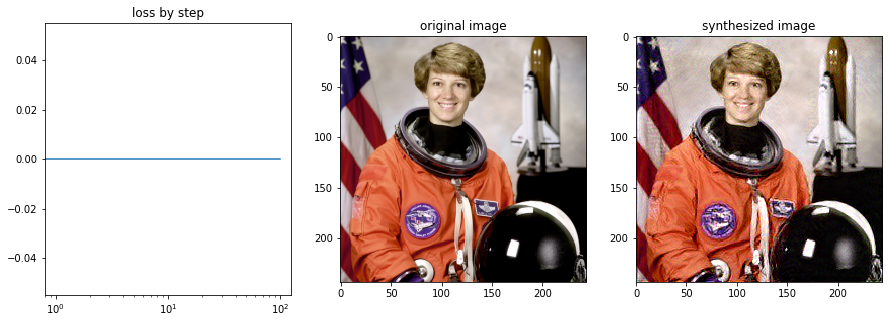

W0520 00:25:58.060103 140250006357824 network.py:847] Model was constructed with shape Tensor("input_1:0", shape=(None, 224, 224, 3), dtype=float32) for input (None, 224, 224, 3), but it was re-called on a Tensor with incompatible shape (1, 244, 244, 3).


block3_conv3


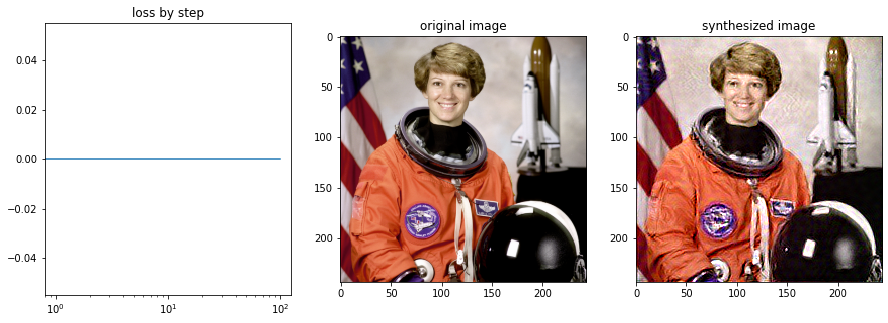

W0520 00:26:07.602386 140250006357824 network.py:847] Model was constructed with shape Tensor("input_1:0", shape=(None, 224, 224, 3), dtype=float32) for input (None, 224, 224, 3), but it was re-called on a Tensor with incompatible shape (1, 244, 244, 3).


block4_conv1


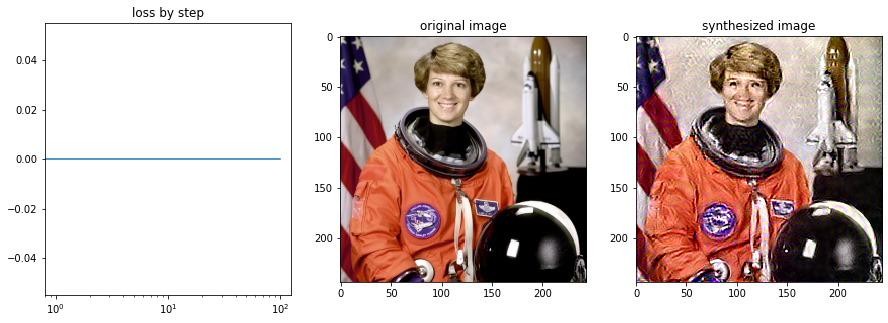

W0520 00:26:17.888680 140250006357824 network.py:847] Model was constructed with shape Tensor("input_1:0", shape=(None, 224, 224, 3), dtype=float32) for input (None, 224, 224, 3), but it was re-called on a Tensor with incompatible shape (1, 244, 244, 3).


block4_conv2


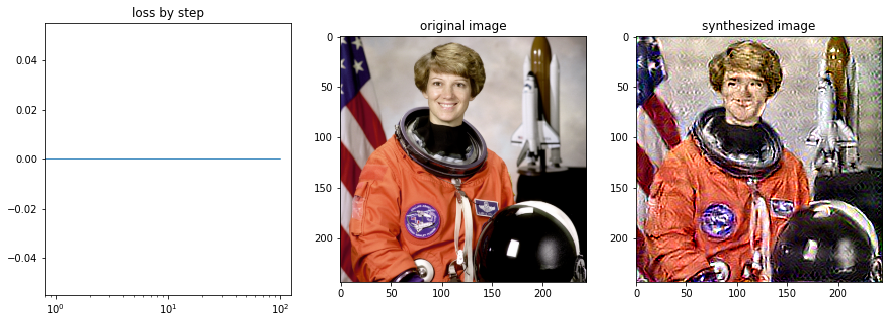

W0520 00:26:29.704946 140250006357824 network.py:847] Model was constructed with shape Tensor("input_1:0", shape=(None, 224, 224, 3), dtype=float32) for input (None, 224, 224, 3), but it was re-called on a Tensor with incompatible shape (1, 244, 244, 3).


block4_conv3


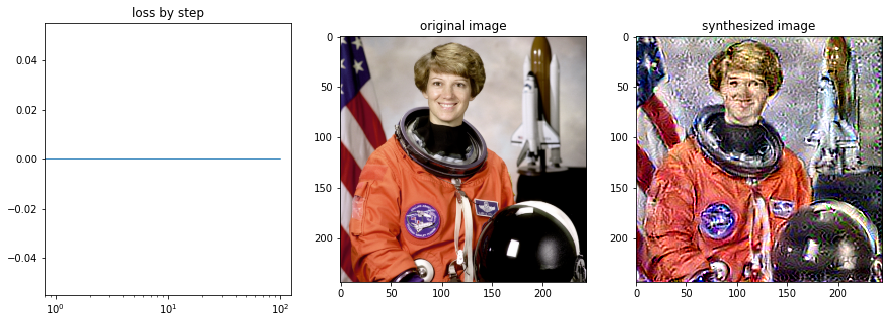

W0520 00:26:42.962009 140250006357824 network.py:847] Model was constructed with shape Tensor("input_1:0", shape=(None, 224, 224, 3), dtype=float32) for input (None, 224, 224, 3), but it was re-called on a Tensor with incompatible shape (1, 244, 244, 3).


block5_conv1


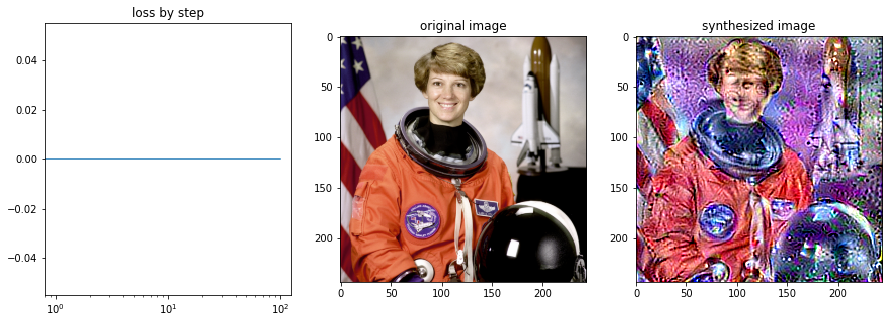

W0520 00:26:57.329354 140250006357824 network.py:847] Model was constructed with shape Tensor("input_1:0", shape=(None, 224, 224, 3), dtype=float32) for input (None, 224, 224, 3), but it was re-called on a Tensor with incompatible shape (1, 244, 244, 3).


block5_conv2


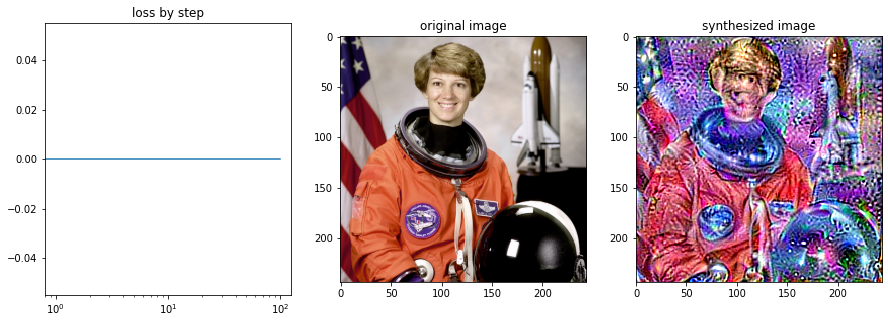

W0520 00:27:12.355590 140250006357824 network.py:847] Model was constructed with shape Tensor("input_1:0", shape=(None, 224, 224, 3), dtype=float32) for input (None, 224, 224, 3), but it was re-called on a Tensor with incompatible shape (1, 244, 244, 3).


block5_conv3


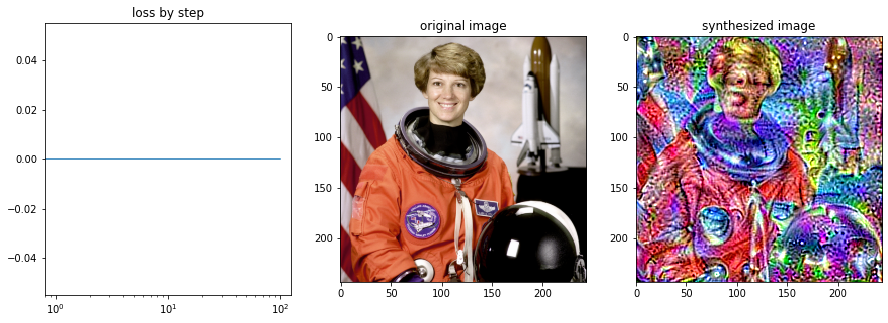

W0520 00:27:28.256906 140250006357824 network.py:847] Model was constructed with shape Tensor("input_1:0", shape=(None, 224, 224, 3), dtype=float32) for input (None, 224, 224, 3), but it was re-called on a Tensor with incompatible shape (1, 244, 244, 3).


fc1


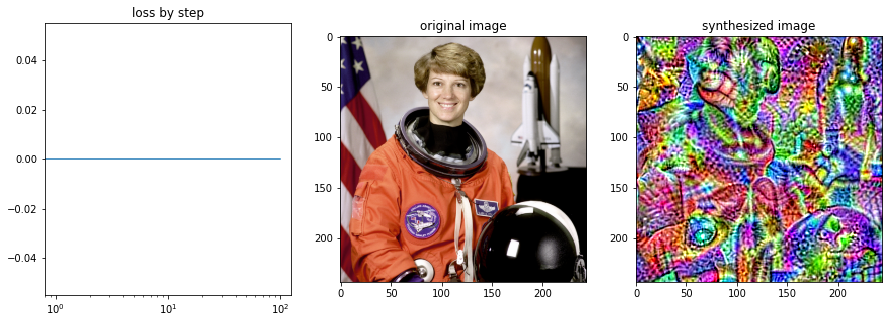

W0520 00:27:46.795675 140250006357824 network.py:847] Model was constructed with shape Tensor("input_1:0", shape=(None, 224, 224, 3), dtype=float32) for input (None, 224, 224, 3), but it was re-called on a Tensor with incompatible shape (1, 244, 244, 3).


fc2


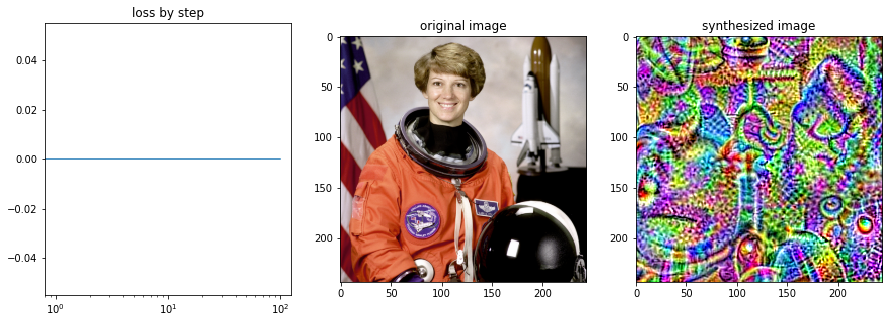

W0520 00:28:06.022776 140250006357824 network.py:847] Model was constructed with shape Tensor("input_1:0", shape=(None, 224, 224, 3), dtype=float32) for input (None, 224, 224, 3), but it was re-called on a Tensor with incompatible shape (1, 244, 244, 3).


predictions


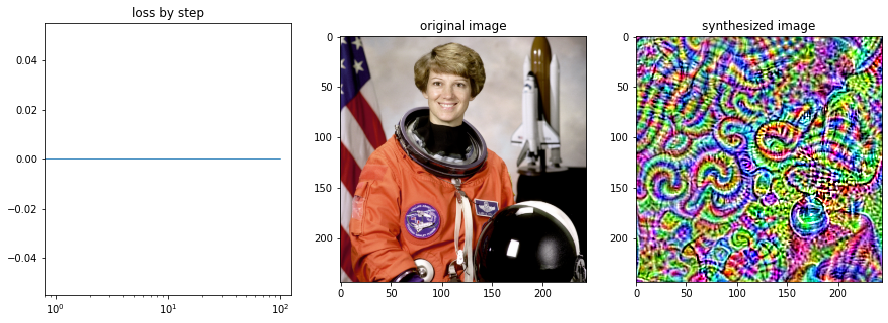

In [180]:
layer_imgs = []

for layer_name in tqdm(layers):
    print(layer_name)
    submodel = tf.keras.models.Model(
        [model.inputs[0]], [model.get_layer(layer_name).output]
    )
    output_images, loss_list = optimize_filter_for_image(
        tf.expand_dims(img[:,:,::-1],0),
        submodel,
        layer_name,
        steps = 20, # how many training steps to perform
        lr=0.1, # gradient step size 
        layer_dims=len(submodel.outputs[0].shape), # how many dimensions the output layer is (2 for fully connected, 4 for convolutional)
        n_upsample=100, # how many steps to upsample
        sigma=1.0, # the amount of blurring to perform when upsampling
        upscaling_factor=1.01, # how much to upsample by
        single_receptive_field=False, # whether to optimize a single neuron, or optimize over the layer
        norm_f = "clip", # how to normalize/color channels between 0 and 1 (clip, sigmoid, )
        soft_norm_std = 3, # the number of standard deviations to clip if norm_f is soft_norm (lower = more saturated)

    )
    layer_imgs.append((layer_name, np.squeeze(output_images[-1])))
    
    # plot image
    fig, axs = plt.subplots(ncols=3, figsize=(15,5))
    axs[0].semilogx(loss_list)
    axs[0].set_title("loss by step")
    axs[1].imshow(np.squeeze(img))
    axs[1].set_title("original image")
    axs[2].imshow(np.squeeze(output_images[-1]))
    axs[2].set_title("synthesized image")
    plt.show()

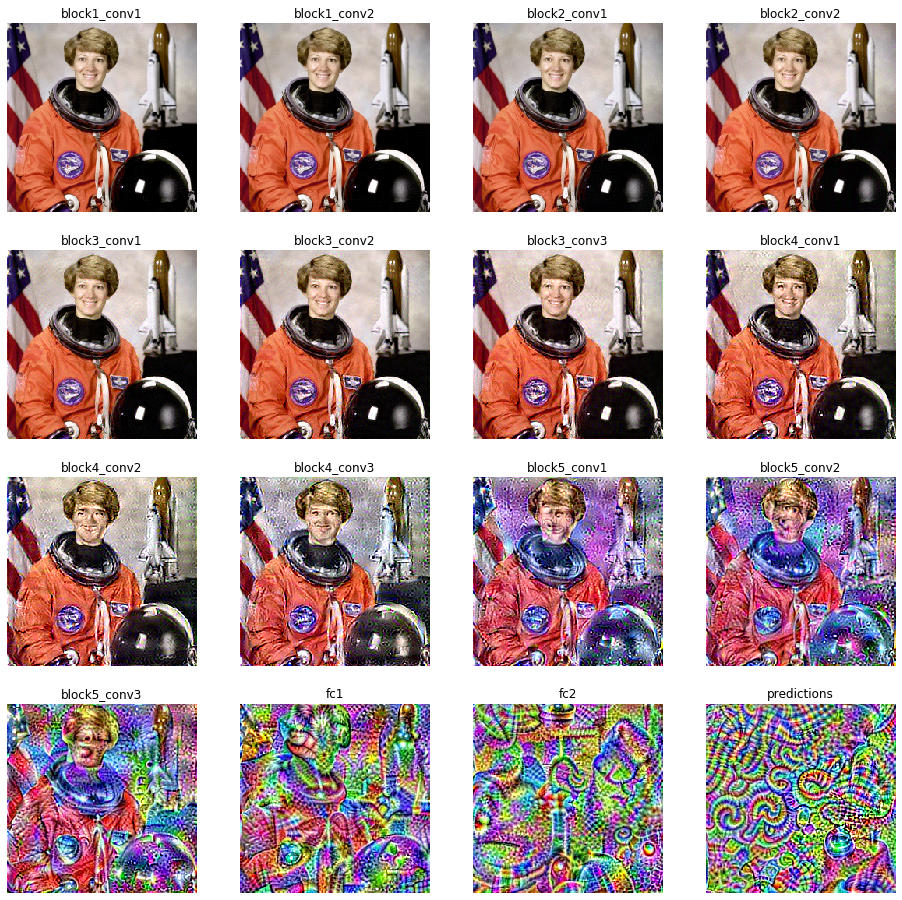

In [181]:
ncols = 4
nrows = int(len(layer_imgs) / ncols)
fig, axs = plt.subplots(ncols=ncols, nrows=nrows, figsize=(ncols*4, nrows*4))
for lii, (ln, li) in enumerate(layer_imgs):
    ax = axs.flatten()[lii]
    ax.set_title(ln)
    ax.imshow(li)
    ax.axis('off')